In [1]:
!pip install git+https://github.com/huggingface/diffusers.git transformers accelerate

  Cloning https://github.com/huggingface/diffusers.git to /tmp/pip-req-build-zhbyeva_
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers.git /tmp/pip-req-build-zhbyeva_
  Resolved https://github.com/huggingface/diffusers.git to commit 2e4dc3e25d6abaf5f15d7e5c62db75a8bd63f915
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.8/126.8 kB 3.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 19.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.1/330.1 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7

In [2]:
!pip install imageio imageio[ffmpeg]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.3/313.3 kB 4.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 67.3 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python -m pip install --upgrade pip


In [3]:
# Copyright 2023 The HuggingFace Team. All rights reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

import inspect
from dataclasses import dataclass
from types import FunctionType
from typing import Any, Callable, Dict, List, Optional, Union

import numpy as np
import torch
from transformers import (
    CLIPImageProcessor,
    CLIPTextModel,
    CLIPTokenizer,
    CLIPVisionModelWithProjection,
)

from diffusers.image_processor import PipelineImageInput, VaeImageProcessor
from diffusers.loaders import (
    IPAdapterMixin,
    LoraLoaderMixin,
    TextualInversionLoaderMixin,
)
from diffusers.models import (
    AutoencoderKL,
    ImageProjection,
    UNet2DConditionModel,
    UNetMotionModel,
)
from diffusers.models.lora import adjust_lora_scale_text_encoder
from diffusers.models.unet_motion_model import MotionAdapter
from diffusers.schedulers import (
    DDIMScheduler,
    DPMSolverMultistepScheduler,
    EulerAncestralDiscreteScheduler,
    EulerDiscreteScheduler,
    LMSDiscreteScheduler,
    PNDMScheduler,
)
from diffusers.utils import (
    USE_PEFT_BACKEND,
    BaseOutput,
    logging,
    scale_lora_layers,
    unscale_lora_layers,
)
from diffusers.utils.torch_utils import randn_tensor
from diffusers.pipelines.pipeline_utils import DiffusionPipeline


logger = logging.get_logger(__name__)  # pylint: disable=invalid-name

EXAMPLE_DOC_STRING = """
    Examples:
        ```py
        >>> import torch
        >>> from diffusers import MotionAdapter, AnimateDiffPipeline, DDIMScheduler
        >>> from diffusers.utils import export_to_gif

        >>> adapter = MotionAdapter.from_pretrained("diffusers/motion-adapter")
        >>> pipe = AnimateDiffPipeline.from_pretrained("frankjoshua/toonyou_beta6", motion_adapter=adapter)
        >>> pipe.scheduler = DDIMScheduler(beta_schedule="linear", steps_offset=1, clip_sample=False)
        >>> output = pipe(prompt="A corgi walking in the park")
        >>> frames = output.frames[0]
        >>> export_to_gif(frames, "animation.gif")
        ```
"""


def lerp(
    v0: torch.Tensor,
    v1: torch.Tensor,
    t: Union[float, torch.Tensor],
) -> torch.Tensor:
    t_is_float = False
    input_device = v0.device
    v0 = v0.cpu().numpy()
    v1 = v1.cpu().numpy()

    if isinstance(t, torch.Tensor):
        t = t.cpu().numpy()
    else:
        t_is_float = True
        t = np.array([t], dtype=v0.dtype)

    t = t[..., None]
    v0 = v0[None, ...]
    v1 = v1[None, ...]
    v2 = (1 - t) * v0 + t * v1

    if t_is_float and v0.ndim > 1:
        assert v2.shape[0] == 1
        v2 = np.squeeze(v2, axis=0)

    v2 = torch.from_numpy(v2).to(input_device)
    return v2


def slerp(
    v0: torch.Tensor,
    v1: torch.Tensor,
    t: Union[float, torch.Tensor],
    DOT_THRESHOLD: float = 0.9995,
) -> torch.Tensor:
    t_is_float = False
    input_device = v0.device
    v0 = v0.cpu().numpy()
    v1 = v1.cpu().numpy()

    if isinstance(t, torch.Tensor):
        t = t.cpu().numpy()
    else:
        t_is_float = True
        t = np.array([t], dtype=v0.dtype)

    dot = np.sum(v0 * v1 / (np.linalg.norm(v0) * np.linalg.norm(v1)))

    if np.abs(dot) > DOT_THRESHOLD:
        # v1 and v2 are close to parallel, so use linear interpolation instead
        v2 = lerp(v0, v1, t)
    else:
        theta_0 = np.arccos(dot)
        sin_theta_0 = np.sin(theta_0)
        theta_t = theta_0 * t
        sin_theta_t = np.sin(theta_t)
        s0 = np.sin(theta_0 - theta_t) / sin_theta_0
        s1 = sin_theta_t / sin_theta_0
        s0 = s0[..., None]
        s1 = s1[..., None]
        v0 = v0[None, ...]
        v1 = v1[None, ...]
        v2 = s0 * v0 + s1 * v1

    if t_is_float and v0.ndim > 1:
        assert v2.shape[0] == 1
        v2 = np.squeeze(v2, axis=0)

    v2 = torch.from_numpy(v2).to(input_device)
    return v2


def tensor2vid(video: torch.Tensor, processor, output_type="np"):
    # Based on:
    # https://github.com/modelscope/modelscope/blob/1509fdb973e5871f37148a4b5e5964cafd43e64d/modelscope/pipelines/multi_modal/text_to_video_synthesis_pipeline.py#L78

    batch_size, channels, num_frames, height, width = video.shape
    outputs = []
    for batch_idx in range(batch_size):
        batch_vid = video[batch_idx].permute(1, 0, 2, 3)
        batch_output = processor.postprocess(batch_vid, output_type)

        outputs.append(batch_output)

    return outputs


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.retrieve_latents
def retrieve_latents(
    encoder_output: torch.Tensor,
    generator: Optional[torch.Generator] = None,
    sample_mode: str = "sample",
):
    if hasattr(encoder_output, "latent_dist") and sample_mode == "sample":
        return encoder_output.latent_dist.sample(generator)
    elif hasattr(encoder_output, "latent_dist") and sample_mode == "argmax":
        return encoder_output.latent_dist.mode()
    elif hasattr(encoder_output, "latents"):
        return encoder_output.latents
    else:
        raise AttributeError("Could not access latents of provided encoder_output")


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.retrieve_timesteps
def retrieve_timesteps(
    scheduler,
    num_inference_steps: Optional[int] = None,
    device: Optional[Union[str, torch.device]] = None,
    timesteps: Optional[List[int]] = None,
    **kwargs,
):
    """
    Calls the scheduler's `set_timesteps` method and retrieves timesteps from the scheduler after the call. Handles
    custom timesteps. Any kwargs will be supplied to `scheduler.set_timesteps`.

    Args:
        scheduler (`SchedulerMixin`):
            The scheduler to get timesteps from.
        num_inference_steps (`int`):
            The number of diffusion steps used when generating samples with a pre-trained model. If used,
            `timesteps` must be `None`.
        device (`str` or `torch.device`, *optional*):
            The device to which the timesteps should be moved to. If `None`, the timesteps are not moved.
        timesteps (`List[int]`, *optional*):
                Custom timesteps used to support arbitrary spacing between timesteps. If `None`, then the default
                timestep spacing strategy of the scheduler is used. If `timesteps` is passed, `num_inference_steps`
                must be `None`.

    Returns:
        `Tuple[torch.Tensor, int]`: A tuple where the first element is the timestep schedule from the scheduler and the
        second element is the number of inference steps.
    """
    if timesteps is not None:
        accepts_timesteps = "timesteps" in set(
            inspect.signature(scheduler.set_timesteps).parameters.keys()
        )
        if not accepts_timesteps:
            raise ValueError(
                f"The current scheduler class {scheduler.__class__}'s `set_timesteps` does not support custom"
                f" timestep schedules. Please check whether you are using the correct scheduler."
            )
        scheduler.set_timesteps(timesteps=timesteps, device=device, **kwargs)
        timesteps = scheduler.timesteps
        num_inference_steps = len(timesteps)
    else:
        scheduler.set_timesteps(num_inference_steps, device=device, **kwargs)
        timesteps = scheduler.timesteps
    return timesteps, num_inference_steps


@dataclass
class AnimateDiffImg2VideoPipelineOutput(BaseOutput):
    frames: Union[torch.Tensor, np.ndarray]


class AnimateDiffImg2VideoPipeline(
    DiffusionPipeline, TextualInversionLoaderMixin, IPAdapterMixin, LoraLoaderMixin
):
    r"""
    Pipeline for text-to-video generation.

    This model inherits from [`DiffusionPipeline`]. Check the superclass documentation for the generic methods
    implemented for all pipelines (downloading, saving, running on a particular device, etc.).

    The pipeline also inherits the following loading methods:
        - [`~loaders.TextualInversionLoaderMixin.load_textual_inversion`] for loading textual inversion embeddings
        - [`~loaders.LoraLoaderMixin.load_lora_weights`] for loading LoRA weights
        - [`~loaders.LoraLoaderMixin.save_lora_weights`] for saving LoRA weights
        - [`~loaders.IPAdapterMixin.load_ip_adapter`] for loading IP Adapters

    Args:
        vae ([`AutoencoderKL`]):
            Variational Auto-Encoder (VAE) Model to encode and decode images to and from latent representations.
        text_encoder ([`CLIPTextModel`]):
            Frozen text-encoder ([clip-vit-large-patch14](https://huggingface.co/openai/clip-vit-large-patch14)).
        tokenizer (`CLIPTokenizer`):
            A [`~transformers.CLIPTokenizer`] to tokenize text.
        unet ([`UNet2DConditionModel`]):
            A [`UNet2DConditionModel`] used to create a UNetMotionModel to denoise the encoded video latents.
        motion_adapter ([`MotionAdapter`]):
            A [`MotionAdapter`] to be used in combination with `unet` to denoise the encoded video latents.
        scheduler ([`SchedulerMixin`]):
            A scheduler to be used in combination with `unet` to denoise the encoded image latents. Can be one of
            [`DDIMScheduler`], [`LMSDiscreteScheduler`], or [`PNDMScheduler`].
    """

    model_cpu_offload_seq = "text_encoder->image_encoder->unet->vae"
    _optional_components = ["feature_extractor", "image_encoder"]

    def __init__(
        self,
        vae: AutoencoderKL,
        text_encoder: CLIPTextModel,
        tokenizer: CLIPTokenizer,
        unet: UNet2DConditionModel,
        motion_adapter: MotionAdapter,
        scheduler: Union[
            DDIMScheduler,
            PNDMScheduler,
            LMSDiscreteScheduler,
            EulerDiscreteScheduler,
            EulerAncestralDiscreteScheduler,
            DPMSolverMultistepScheduler,
        ],
        feature_extractor: CLIPImageProcessor = None,
        image_encoder: CLIPVisionModelWithProjection = None,
    ):
        super().__init__()
        unet = UNetMotionModel.from_unet2d(unet, motion_adapter)

        self.register_modules(
            vae=vae,
            text_encoder=text_encoder,
            tokenizer=tokenizer,
            unet=unet,
            motion_adapter=motion_adapter,
            scheduler=scheduler,
            feature_extractor=feature_extractor,
            image_encoder=image_encoder,
        )
        self.vae_scale_factor = 2 ** (len(self.vae.config.block_out_channels) - 1)
        self.image_processor = VaeImageProcessor(vae_scale_factor=self.vae_scale_factor)

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.encode_prompt with num_images_per_prompt -> num_videos_per_prompt
    def encode_prompt(
        self,
        prompt,
        device,
        num_images_per_prompt,
        do_classifier_free_guidance,
        negative_prompt=None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        lora_scale: Optional[float] = None,
        clip_skip: Optional[int] = None,
    ):
        r"""
        Encodes the prompt into text encoder hidden states.

        Args:
            prompt (`str` or `List[str]`, *optional*):
                prompt to be encoded
            device: (`torch.device`):
                torch device
            num_images_per_prompt (`int`):
                number of images that should be generated per prompt
            do_classifier_free_guidance (`bool`):
                whether to use classifier free guidance or not
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation. If not defined, one has to pass
                `negative_prompt_embeds` instead. Ignored when not using guidance (i.e., ignored if `guidance_scale` is
                less than `1`).
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting. If not
                provided, text embeddings will be generated from `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, negative_prompt_embeds will be generated from `negative_prompt` input
                argument.
            lora_scale (`float`, *optional*):
                A LoRA scale that will be applied to all LoRA layers of the text encoder if LoRA layers are loaded.
            clip_skip (`int`, *optional*):
                Number of layers to be skipped from CLIP while computing the prompt embeddings. A value of 1 means that
                the output of the pre-final layer will be used for computing the prompt embeddings.
        """
        # set lora scale so that monkey patched LoRA
        # function of text encoder can correctly access it
        if lora_scale is not None and isinstance(self, LoraLoaderMixin):
            self._lora_scale = lora_scale

            # dynamically adjust the LoRA scale
            if not USE_PEFT_BACKEND:
                adjust_lora_scale_text_encoder(self.text_encoder, lora_scale)
            else:
                scale_lora_layers(self.text_encoder, lora_scale)

        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        if prompt_embeds is None:
            # textual inversion: procecss multi-vector tokens if necessary
            if isinstance(self, TextualInversionLoaderMixin):
                prompt = self.maybe_convert_prompt(prompt, self.tokenizer)

            text_inputs = self.tokenizer(
                prompt,
                padding="max_length",
                max_length=self.tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt",
            )
            text_input_ids = text_inputs.input_ids
            untruncated_ids = self.tokenizer(
                prompt, padding="longest", return_tensors="pt"
            ).input_ids

            if untruncated_ids.shape[-1] >= text_input_ids.shape[
                -1
            ] and not torch.equal(text_input_ids, untruncated_ids):
                removed_text = self.tokenizer.batch_decode(
                    untruncated_ids[:, self.tokenizer.model_max_length - 1 : -1]
                )
                logger.warning(
                    "The following part of your input was truncated because CLIP can only handle sequences up to"
                    f" {self.tokenizer.model_max_length} tokens: {removed_text}"
                )

            if (
                hasattr(self.text_encoder.config, "use_attention_mask")
                and self.text_encoder.config.use_attention_mask
            ):
                attention_mask = text_inputs.attention_mask.to(device)
            else:
                attention_mask = None

            if clip_skip is None:
                prompt_embeds = self.text_encoder(
                    text_input_ids.to(device), attention_mask=attention_mask
                )
                prompt_embeds = prompt_embeds[0]
            else:
                prompt_embeds = self.text_encoder(
                    text_input_ids.to(device),
                    attention_mask=attention_mask,
                    output_hidden_states=True,
                )
                # Access the `hidden_states` first, that contains a tuple of
                # all the hidden states from the encoder layers. Then index into
                # the tuple to access the hidden states from the desired layer.
                prompt_embeds = prompt_embeds[-1][-(clip_skip + 1)]
                # We also need to apply the final LayerNorm here to not mess with the
                # representations. The `last_hidden_states` that we typically use for
                # obtaining the final prompt representations passes through the LayerNorm
                # layer.
                prompt_embeds = self.text_encoder.text_model.final_layer_norm(
                    prompt_embeds
                )

        if self.text_encoder is not None:
            prompt_embeds_dtype = self.text_encoder.dtype
        elif self.unet is not None:
            prompt_embeds_dtype = self.unet.dtype
        else:
            prompt_embeds_dtype = prompt_embeds.dtype

        prompt_embeds = prompt_embeds.to(dtype=prompt_embeds_dtype, device=device)

        bs_embed, seq_len, _ = prompt_embeds.shape
        # duplicate text embeddings for each generation per prompt, using mps friendly method
        prompt_embeds = prompt_embeds.repeat(1, num_images_per_prompt, 1)
        prompt_embeds = prompt_embeds.view(
            bs_embed * num_images_per_prompt, seq_len, -1
        )

        # get unconditional embeddings for classifier free guidance
        if do_classifier_free_guidance and negative_prompt_embeds is None:
            uncond_tokens: List[str]
            if negative_prompt is None:
                uncond_tokens = [""] * batch_size
            elif prompt is not None and type(prompt) is not type(negative_prompt):
                raise TypeError(
                    f"`negative_prompt` should be the same type to `prompt`, but got {type(negative_prompt)} !="
                    f" {type(prompt)}."
                )
            elif isinstance(negative_prompt, str):
                uncond_tokens = [negative_prompt]
            elif batch_size != len(negative_prompt):
                raise ValueError(
                    f"`negative_prompt`: {negative_prompt} has batch size {len(negative_prompt)}, but `prompt`:"
                    f" {prompt} has batch size {batch_size}. Please make sure that passed `negative_prompt` matches"
                    " the batch size of `prompt`."
                )
            else:
                uncond_tokens = negative_prompt

            # textual inversion: procecss multi-vector tokens if necessary
            if isinstance(self, TextualInversionLoaderMixin):
                uncond_tokens = self.maybe_convert_prompt(uncond_tokens, self.tokenizer)

            max_length = prompt_embeds.shape[1]
            uncond_input = self.tokenizer(
                uncond_tokens,
                padding="max_length",
                max_length=max_length,
                truncation=True,
                return_tensors="pt",
            )

            if (
                hasattr(self.text_encoder.config, "use_attention_mask")
                and self.text_encoder.config.use_attention_mask
            ):
                attention_mask = uncond_input.attention_mask.to(device)
            else:
                attention_mask = None

            negative_prompt_embeds = self.text_encoder(
                uncond_input.input_ids.to(device),
                attention_mask=attention_mask,
            )
            negative_prompt_embeds = negative_prompt_embeds[0]

        if do_classifier_free_guidance:
            # duplicate unconditional embeddings for each generation per prompt, using mps friendly method
            seq_len = negative_prompt_embeds.shape[1]

            negative_prompt_embeds = negative_prompt_embeds.to(
                dtype=prompt_embeds_dtype, device=device
            )

            negative_prompt_embeds = negative_prompt_embeds.repeat(
                1, num_images_per_prompt, 1
            )
            negative_prompt_embeds = negative_prompt_embeds.view(
                batch_size * num_images_per_prompt, seq_len, -1
            )

        if isinstance(self, LoraLoaderMixin) and USE_PEFT_BACKEND:
            # Retrieve the original scale by scaling back the LoRA layers
            unscale_lora_layers(self.text_encoder, lora_scale)

        return prompt_embeds, negative_prompt_embeds

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.encode_image
    def encode_image(
        self, image, device, num_images_per_prompt, output_hidden_states=None
    ):
        dtype = next(self.image_encoder.parameters()).dtype

        if not isinstance(image, torch.Tensor):
            image = self.feature_extractor(image, return_tensors="pt").pixel_values

        image = image.to(device=device, dtype=dtype)
        if output_hidden_states:
            image_enc_hidden_states = self.image_encoder(
                image, output_hidden_states=True
            ).hidden_states[-2]
            image_enc_hidden_states = image_enc_hidden_states.repeat_interleave(
                num_images_per_prompt, dim=0
            )
            uncond_image_enc_hidden_states = self.image_encoder(
                torch.zeros_like(image), output_hidden_states=True
            ).hidden_states[-2]
            uncond_image_enc_hidden_states = (
                uncond_image_enc_hidden_states.repeat_interleave(
                    num_images_per_prompt, dim=0
                )
            )
            return image_enc_hidden_states, uncond_image_enc_hidden_states
        else:
            image_embeds = self.image_encoder(image).image_embeds
            image_embeds = image_embeds.repeat_interleave(num_images_per_prompt, dim=0)
            uncond_image_embeds = torch.zeros_like(image_embeds)

            return image_embeds, uncond_image_embeds

    # Copied from diffusers.pipelines.text_to_video_synthesis/pipeline_text_to_video_synth.TextToVideoSDPipeline.decode_latents
    def decode_latents(self, latents):
        latents = 1 / self.vae.config.scaling_factor * latents

        batch_size, channels, num_frames, height, width = latents.shape
        latents = latents.permute(0, 2, 1, 3, 4).reshape(
            batch_size * num_frames, channels, height, width
        )

        image = self.vae.decode(latents).sample
        video = (
            image[None, :]
            .reshape(
                (
                    batch_size,
                    num_frames,
                    -1,
                )
                + image.shape[2:]
            )
            .permute(0, 2, 1, 3, 4)
        )
        # we always cast to float32 as this does not cause significant overhead and is compatible with bfloat16
        video = video.float()
        return video

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_vae_slicing
    def enable_vae_slicing(self):
        r"""
        Enable sliced VAE decoding. When this option is enabled, the VAE will split the input tensor in slices to
        compute decoding in several steps. This is useful to save some memory and allow larger batch sizes.
        """
        self.vae.enable_slicing()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_vae_slicing
    def disable_vae_slicing(self):
        r"""
        Disable sliced VAE decoding. If `enable_vae_slicing` was previously enabled, this method will go back to
        computing decoding in one step.
        """
        self.vae.disable_slicing()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_vae_tiling
    def enable_vae_tiling(self):
        r"""
        Enable tiled VAE decoding. When this option is enabled, the VAE will split the input tensor into tiles to
        compute decoding and encoding in several steps. This is useful for saving a large amount of memory and to allow
        processing larger images.
        """
        self.vae.enable_tiling()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_vae_tiling
    def disable_vae_tiling(self):
        r"""
        Disable tiled VAE decoding. If `enable_vae_tiling` was previously enabled, this method will go back to
        computing decoding in one step.
        """
        self.vae.disable_tiling()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_freeu
    def enable_freeu(self, s1: float, s2: float, b1: float, b2: float):
        r"""Enables the FreeU mechanism as in https://arxiv.org/abs/2309.11497.

        The suffixes after the scaling factors represent the stages where they are being applied.

        Please refer to the [official repository](https://github.com/ChenyangSi/FreeU) for combinations of the values
        that are known to work well for different pipelines such as Stable Diffusion v1, v2, and Stable Diffusion XL.

        Args:
            s1 (`float`):
                Scaling factor for stage 1 to attenuate the contributions of the skip features. This is done to
                mitigate "oversmoothing effect" in the enhanced denoising process.
            s2 (`float`):
                Scaling factor for stage 2 to attenuate the contributions of the skip features. This is done to
                mitigate "oversmoothing effect" in the enhanced denoising process.
            b1 (`float`): Scaling factor for stage 1 to amplify the contributions of backbone features.
            b2 (`float`): Scaling factor for stage 2 to amplify the contributions of backbone features.
        """
        if not hasattr(self, "unet"):
            raise ValueError("The pipeline must have `unet` for using FreeU.")
        self.unet.enable_freeu(s1=s1, s2=s2, b1=b1, b2=b2)

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_freeu
    def disable_freeu(self):
        """Disables the FreeU mechanism if enabled."""
        self.unet.disable_freeu()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.prepare_extra_step_kwargs
    def prepare_extra_step_kwargs(self, generator, eta):
        # prepare extra kwargs for the scheduler step, since not all schedulers have the same signature
        # eta (η) is only used with the DDIMScheduler, it will be ignored for other schedulers.
        # eta corresponds to η in DDIM paper: https://arxiv.org/abs/2010.02502
        # and should be between [0, 1]

        accepts_eta = "eta" in set(
            inspect.signature(self.scheduler.step).parameters.keys()
        )
        extra_step_kwargs = {}
        if accepts_eta:
            extra_step_kwargs["eta"] = eta

        # check if the scheduler accepts generator
        accepts_generator = "generator" in set(
            inspect.signature(self.scheduler.step).parameters.keys()
        )
        if accepts_generator:
            extra_step_kwargs["generator"] = generator
        return extra_step_kwargs

    def check_inputs(
        self,
        prompt,
        height,
        width,
        callback_steps,
        negative_prompt=None,
        prompt_embeds=None,
        negative_prompt_embeds=None,
        callback_on_step_end_tensor_inputs=None,
        latent_interpolation_method=None,
    ):
        if height % 8 != 0 or width % 8 != 0:
            raise ValueError(
                f"`height` and `width` have to be divisible by 8 but are {height} and {width}."
            )

        if callback_steps is not None and (
            not isinstance(callback_steps, int) or callback_steps <= 0
        ):
            raise ValueError(
                f"`callback_steps` has to be a positive integer but is {callback_steps} of type"
                f" {type(callback_steps)}."
            )
        if callback_on_step_end_tensor_inputs is not None and not all(
            k in self._callback_tensor_inputs
            for k in callback_on_step_end_tensor_inputs
        ):
            raise ValueError(
                f"`callback_on_step_end_tensor_inputs` has to be in {self._callback_tensor_inputs}, but found {[k for k in callback_on_step_end_tensor_inputs if k not in self._callback_tensor_inputs]}"
            )

        if prompt is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt`: {prompt} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt is None and prompt_embeds is None:
            raise ValueError(
                "Provide either `prompt` or `prompt_embeds`. Cannot leave both `prompt` and `prompt_embeds` undefined."
            )
        elif prompt is not None and (
            not isinstance(prompt, str) and not isinstance(prompt, list)
        ):
            raise ValueError(
                f"`prompt` has to be of type `str` or `list` but is {type(prompt)}"
            )

        if negative_prompt is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt`: {negative_prompt} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )

        if prompt_embeds is not None and negative_prompt_embeds is not None:
            if prompt_embeds.shape != negative_prompt_embeds.shape:
                raise ValueError(
                    "`prompt_embeds` and `negative_prompt_embeds` must have the same shape when passed directly, but"
                    f" got: `prompt_embeds` {prompt_embeds.shape} != `negative_prompt_embeds`"
                    f" {negative_prompt_embeds.shape}."
                )

        if latent_interpolation_method is not None:
            if latent_interpolation_method not in ["lerp", "slerp"] and not isinstance(
                latent_interpolation_method, FunctionType
            ):
                raise ValueError(
                    "`latent_interpolation_method` must be one of `lerp`, `slerp` or a Callable[[torch.Tensor, torch.Tensor, int], torch.Tensor]"
                )

    def prepare_latents(
        self,
        image,
        strength,
        batch_size,
        num_channels_latents,
        num_frames,
        height,
        width,
        dtype,
        device,
        generator,
        latents=None,
        latent_interpolation_method="lerp",
    ):
        shape = (
            batch_size,
            num_channels_latents,
            num_frames,
            height // self.vae_scale_factor,
            width // self.vae_scale_factor,
        )
        if isinstance(generator, list) and len(generator) != batch_size:
            raise ValueError(
                f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                f" size of {batch_size}. Make sure the batch size matches the length of the generators."
            )

        image = image.to(device=device, dtype=dtype)

        if image.shape[1] == 4:
            latents = image
        else:
            # make sure the VAE is in float32 mode, as it overflows in float16
            if self.vae.config.force_upcast:
                image = image.float()
                self.vae.to(dtype=torch.float32)

            if isinstance(generator, list):
                if len(generator) != batch_size:
                    raise ValueError(
                        f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                        f" size of {batch_size}. Make sure the batch size matches the length of the generators."
                    )

                init_latents = [
                    retrieve_latents(
                        self.vae.encode(image[i : i + 1]), generator=generator[i]
                    )
                    for i in range(batch_size)
                ]
                init_latents = torch.cat(init_latents, dim=0)
            else:
                init_latents = retrieve_latents(
                    self.vae.encode(image), generator=generator
                )

            if self.vae.config.force_upcast:
                self.vae.to(dtype)

            init_latents = init_latents.to(dtype)
            init_latents = self.vae.config.scaling_factor * init_latents
            latents = randn_tensor(
                shape, generator=generator, device=device, dtype=dtype
            )
            latents = latents * self.scheduler.init_noise_sigma

            if latent_interpolation_method == "lerp":

                def latent_cls(v0, v1, index):
                    return lerp(v0, v1, index / num_frames * (1 - strength))

            elif latent_interpolation_method == "slerp":

                def latent_cls(v0, v1, index):
                    return slerp(v0, v1, index / num_frames * (1 - strength))

            else:
                latent_cls = latent_interpolation_method

            for i in range(num_frames):
                latents[:, :, i, :, :] = latent_cls(
                    latents[:, :, i, :, :], init_latents, i
                )

        return latents

    @torch.no_grad()
    def __call__(
        self,
        image: PipelineImageInput,
        prompt: Optional[Union[str, List[str]]] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        num_frames: int = 16,
        num_inference_steps: int = 50,
        timesteps: Optional[List[int]] = None,
        guidance_scale: float = 7.5,
        strength: float = 0.8,
        negative_prompt: Optional[Union[str, List[str]]] = None,
        num_videos_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        ip_adapter_image: Optional[PipelineImageInput] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: Optional[int] = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        clip_skip: Optional[int] = None,
        latent_interpolation_method: Union[
            str, Callable[[torch.Tensor, torch.Tensor, int], torch.Tensor]
        ] = "lerp",
    ):
        r"""
        The call function to the pipeline for generation.

        Args:
            image (`PipelineImageInput`):
                The input image to condition the generation on.
            prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts to guide image generation. If not defined, you need to pass `prompt_embeds`.
            height (`int`, *optional*, defaults to `self.unet.config.sample_size * self.vae_scale_factor`):
                The height in pixels of the generated video.
            width (`int`, *optional*, defaults to `self.unet.config.sample_size * self.vae_scale_factor`):
                The width in pixels of the generated video.
            num_frames (`int`, *optional*, defaults to 16):
                The number of video frames that are generated. Defaults to 16 frames which at 8 frames per seconds
                amounts to 2 seconds of video.
            num_inference_steps (`int`, *optional*, defaults to 50):
                The number of denoising steps. More denoising steps usually lead to a higher quality videos at the
                expense of slower inference.
            strength (`float`, *optional*, defaults to 0.8):
                Higher strength leads to more differences between original image and generated video.
            guidance_scale (`float`, *optional*, defaults to 7.5):
                A higher guidance scale value encourages the model to generate images closely linked to the text
                `prompt` at the expense of lower image quality. Guidance scale is enabled when `guidance_scale > 1`.
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts to guide what to not include in image generation. If not defined, you need to
                pass `negative_prompt_embeds` instead. Ignored when not using guidance (`guidance_scale < 1`).
            eta (`float`, *optional*, defaults to 0.0):
                Corresponds to parameter eta (η) from the [DDIM](https://arxiv.org/abs/2010.02502) paper. Only applies
                to the [`~schedulers.DDIMScheduler`], and is ignored in other schedulers.
            generator (`torch.Generator` or `List[torch.Generator]`, *optional*):
                A [`torch.Generator`](https://pytorch.org/docs/stable/generated/torch.Generator.html) to make
                generation deterministic.
            latents (`torch.FloatTensor`, *optional*):
                Pre-generated noisy latents sampled from a Gaussian distribution, to be used as inputs for video
                generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
                tensor is generated by sampling using the supplied random `generator`. Latents should be of shape
                `(batch_size, num_channel, num_frames, height, width)`.
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs (prompt weighting). If not
                provided, text embeddings are generated from the `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs (prompt weighting). If
                not provided, `negative_prompt_embeds` are generated from the `negative_prompt` input argument.
            ip_adapter_image: (`PipelineImageInput`, *optional*):
                Optional image input to work with IP Adapters.
            output_type (`str`, *optional*, defaults to `"pil"`):
                The output format of the generated video. Choose between `torch.FloatTensor`, `PIL.Image` or
                `np.array`.
            return_dict (`bool`, *optional*, defaults to `True`):
                Whether or not to return a [`AnimateDiffImg2VideoPipelineOutput`] instead
                of a plain tuple.
            callback (`Callable`, *optional*):
                A function that calls every `callback_steps` steps during inference. The function is called with the
                following arguments: `callback(step: int, timestep: int, latents: torch.FloatTensor)`.
            callback_steps (`int`, *optional*, defaults to 1):
                The frequency at which the `callback` function is called. If not specified, the callback is called at
                every step.
            cross_attention_kwargs (`dict`, *optional*):
                A kwargs dictionary that if specified is passed along to the [`AttentionProcessor`] as defined in
                [`self.processor`](https://github.com/huggingface/diffusers/blob/main/src/diffusers/models/attention_processor.py).
            clip_skip (`int`, *optional*):
                Number of layers to be skipped from CLIP while computing the prompt embeddings. A value of 1 means that
                the output of the pre-final layer will be used for computing the prompt embeddings.
            latent_interpolation_method (`str` or `Callable[[torch.Tensor, torch.Tensor, int], torch.Tensor]]`, *optional*):
                Must be one of "lerp", "slerp" or a callable that takes in a random noisy latent, image latent and a frame index
                as input and returns an initial latent for sampling.
        Examples:

        Returns:
            [`AnimateDiffImg2VideoPipelineOutput`] or `tuple`:
                If `return_dict` is `True`, [`AnimateDiffImg2VideoPipelineOutput`] is
                returned, otherwise a `tuple` is returned where the first element is a list with the generated frames.
        """
        # 0. Default height and width to unet
        height = height or self.unet.config.sample_size * self.vae_scale_factor
        width = width or self.unet.config.sample_size * self.vae_scale_factor

        num_videos_per_prompt = 1

        # 1. Check inputs. Raise error if not correct
        self.check_inputs(
            prompt=prompt,
            height=height,
            width=width,
            callback_steps=callback_steps,
            negative_prompt=negative_prompt,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            latent_interpolation_method=latent_interpolation_method,
        )

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device

        # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
        # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
        # corresponds to doing no classifier free guidance.
        do_classifier_free_guidance = guidance_scale > 1.0

        # 3. Encode input prompt
        text_encoder_lora_scale = (
            cross_attention_kwargs.get("scale", None)
            if cross_attention_kwargs is not None
            else None
        )
        prompt_embeds, negative_prompt_embeds = self.encode_prompt(
            prompt,
            device,
            num_videos_per_prompt,
            do_classifier_free_guidance,
            negative_prompt,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            lora_scale=text_encoder_lora_scale,
            clip_skip=clip_skip,
        )

        # For classifier free guidance, we need to do two forward passes.
        # Here we concatenate the unconditional and text embeddings into a single batch
        # to avoid doing two forward passes
        if do_classifier_free_guidance:
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

        if ip_adapter_image is not None:
            output_hidden_state = (
                False
                if isinstance(self.unet.encoder_hid_proj, ImageProjection)
                else True
            )
            image_embeds, negative_image_embeds = self.encode_image(
                ip_adapter_image, device, num_videos_per_prompt, output_hidden_state
            )
            if do_classifier_free_guidance:
                image_embeds = torch.cat([negative_image_embeds, image_embeds])

        # 4. Preprocess image
        image = self.image_processor.preprocess(image, height=height, width=width)

        # 5. Prepare timesteps
        timesteps, num_inference_steps = retrieve_timesteps(
            self.scheduler, num_inference_steps, device, timesteps
        )

        # 6. Prepare latent variables
        num_channels_latents = self.unet.config.in_channels
        latents = self.prepare_latents(
            image=image,
            strength=strength,
            batch_size=batch_size * num_videos_per_prompt,
            num_channels_latents=num_channels_latents,
            num_frames=num_frames,
            height=height,
            width=width,
            dtype=prompt_embeds.dtype,
            device=device,
            generator=generator,
            latents=latents,
            latent_interpolation_method=latent_interpolation_method,
        )

        # 7. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        # 8. Add image embeds for IP-Adapter
        added_cond_kwargs = (
            {"image_embeds": image_embeds} if ip_adapter_image is not None else None
        )

        # 9. Denoising loop
        num_warmup_steps = len(timesteps) - num_inference_steps * self.scheduler.order
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # expand the latents if we are doing classifier free guidance
                latent_model_input = (
                    torch.cat([latents] * 2) if do_classifier_free_guidance else latents
                )
                latent_model_input = self.scheduler.scale_model_input(
                    latent_model_input, t
                )

                # predict the noise residual
                noise_pred = self.unet(
                    latent_model_input,
                    t,
                    encoder_hidden_states=prompt_embeds,
                    cross_attention_kwargs=cross_attention_kwargs,
                    added_cond_kwargs=added_cond_kwargs,
                ).sample

                # perform guidance
                if do_classifier_free_guidance:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (
                        noise_pred_text - noise_pred_uncond
                    )

                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(
                    noise_pred, t, latents, **extra_step_kwargs
                ).prev_sample

                # call the callback, if provided
                if i == len(timesteps) - 1 or (
                    (i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0
                ):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        callback(i, t, latents)

        if output_type == "latent":
            return AnimateDiffImg2VideoPipelineOutput(frames=latents)

        # 10. Post-processing
        video_tensor = self.decode_latents(latents)

        if output_type == "pt":
            video = video_tensor
        else:
            video = tensor2vid(
                video_tensor, self.image_processor, output_type=output_type
            )

        # 11. Offload all models
        self.maybe_free_model_hooks()

        if not return_dict:
            return (video,)

        return AnimateDiffImg2VideoPipelineOutput(frames=video)

In [5]:
adapter = MotionAdapter.from_pretrained("guoyww/animatediff-motion-adapter-v1-5-2")

config.json:   0%|          | 0.00/455 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.82G [00:00<?, ?B/s]

The config attributes {'motion_activation_fn': 'geglu', 'motion_attention_bias': False, 'motion_cross_attention_dim': None} were passed to MotionAdapter, but are not expected and will be ignored. Please verify your config.json configuration file.


In [15]:
model_id = "SG161222/Realistic_Vision_V5.1_noVAE"
# model_id = "Lykon/dreamshaper-8"
pipe = AnimateDiffImg2VideoPipeline.from_pretrained(
    model_id, motion_adapter=adapter, torch_dtype=torch.float16
)
scheduler = DDIMScheduler.from_pretrained(
    model_id,
    beta_schedule="linear",
    subfolder="scheduler",
    clip_sample=False,
    timestep_spacing="linspace",
    steps_offset=1,
)
pipe.scheduler = scheduler

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

The config attributes {'center_input_sample': False, 'flip_sin_to_cos': True, 'freq_shift': 0, 'mid_block_type': 'UNetMidBlock2DCrossAttn', 'only_cross_attention': False, 'attention_head_dim': 8, 'dual_cross_attention': False, 'class_embed_type': None, 'addition_embed_type': None, 'num_class_embeds': None, 'upcast_attention': False, 'resnet_time_scale_shift': 'default', 'resnet_skip_time_act': False, 'resnet_out_scale_factor': 1.0, 'time_embedding_type': 'positional', 'time_embedding_dim': None, 'time_embedding_act_fn': None, 'timestep_post_act': None, 'time_cond_proj_dim': None, 'conv_in_kernel': 3, 'conv_out_kernel': 3, 'projection_class_embeddings_input_dim': None, 'class_embeddings_concat': False, 'mid_block_only_cross_attention': None, 'cross_attention_norm': None, 'addition_embed_type_num_heads': 64} were passed to UNetMotionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


In [16]:
# pipe.enable_vae_slicing()
pipe = pipe.to("cuda")

In [61]:
from IPython.display import display, Image
from diffusers.utils import export_to_gif
from PIL import Image as PILImage
from io import BytesIO


def image_grid(images, rows, cols):
    if len(images) > rows * cols:
        raise ValueError(
            f"Number of images ({len(images)}) exceeds grid size ({rows}x{cols})."
        )
    w, h = images[0].size
    grid = PILImage.new("RGB", size=(cols * w, rows * h))
    for i, image in enumerate(images):
        grid.paste(image, box=(i % cols * w, i // cols * h))
    return grid

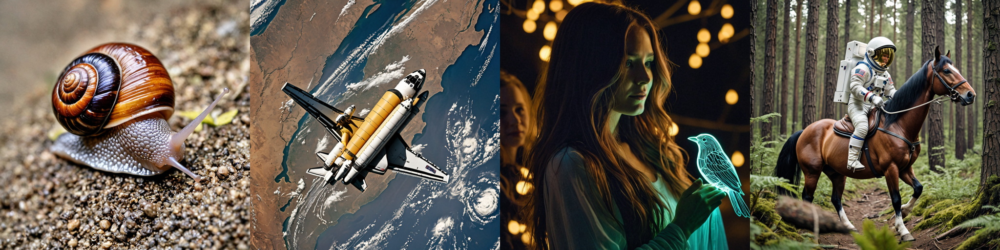

In [9]:
prompts = {
    "0062.png": "A snail moving on the ground",
    "0310.png": "The Space Shuttle Endeavor, flying over the Earth",
    "0372.png": "A pretty woman with long hair next to a luminescent bird",
    "0737.png": "An astronaut riding a horse in the forest",
}

images = {key: PILImage.open(key).resize((512, 512)) for key in prompts.keys()}

image_grid(list(images.values()), 1, 4)

In [ ]:
for method in ["lerp", "slerp"]:
    for key, prompt in prompts.items():
        for strength in [0.75, 0.84, 0.92]:
            output = pipe(
                image=images[key],
                prompt=f"{prompt}, high quality, bright background, realistic, 4k",
                negative_prompt="low quality",
                num_frames=16,
                guidance_scale=10,
                num_inference_steps=25,
                strength=strength,
                generator=torch.Generator("cpu").manual_seed(31337),
                latent_interpolation_method=method,
            )
            frames = output.frames[0]
            export_to_gif(frames, f"img2vid-{key[:-4]}-{method}-{strength}.gif")

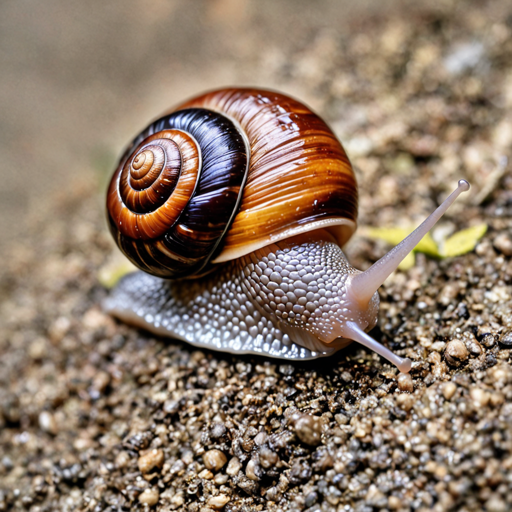

In [24]:
img = PILImage.open("0062.png").resize((512, 512))
img

In [17]:
method = "lerp"
output = pipe(
    image=img,
    # prompt="A man, dressed in business attire, skull instead of face, walking forwards with fire burning behind him, destruction, realistic, high quality, bright background",
    prompt="A snail moving on the ground",
    negative_prompt="bad quality, worse quality",
    height=512,
    width=512,
    num_frames=16,
    guidance_scale=10,
    num_inference_steps=20,
    strength=0.8,
    generator=torch.Generator("cpu").manual_seed(42),
    latent_interpolation_method=method,
)

  0%|          | 0/20 [00:00<?, ?it/s]

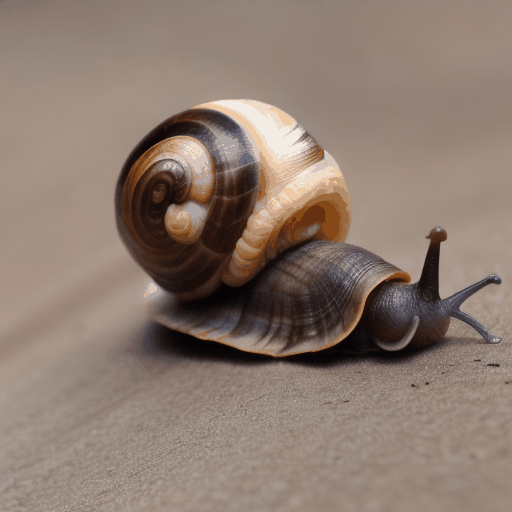

In [18]:
frames = output.frames[0]
export_to_gif(frames, f"animation_img2vid_{method}.gif")
display(Image(f"animation_img2vid_{method}.gif", embed=True))

In [81]:
# Copyright 2023 The HuggingFace Team. All rights reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

import inspect
from dataclasses import dataclass
from types import FunctionType
from typing import Any, Callable, Dict, List, Optional, Union

import numpy as np
import torch
from transformers import (
    CLIPImageProcessor,
    CLIPTextModel,
    CLIPTokenizer,
    CLIPVisionModelWithProjection,
)

from diffusers.image_processor import PipelineImageInput, VaeImageProcessor
from diffusers.loaders import (
    IPAdapterMixin,
    LoraLoaderMixin,
    TextualInversionLoaderMixin,
)
from diffusers.models import (
    AutoencoderKL,
    ImageProjection,
    UNet2DConditionModel,
    UNetMotionModel,
)
from diffusers.models.lora import adjust_lora_scale_text_encoder
from diffusers.models.unet_motion_model import MotionAdapter
from diffusers.schedulers import (
    DDIMScheduler,
    DPMSolverMultistepScheduler,
    EulerAncestralDiscreteScheduler,
    EulerDiscreteScheduler,
    LMSDiscreteScheduler,
    PNDMScheduler,
)
from diffusers.utils import (
    USE_PEFT_BACKEND,
    BaseOutput,
    deprecate,
    logging,
    scale_lora_layers,
    unscale_lora_layers,
)
from diffusers.utils.torch_utils import randn_tensor
from diffusers.pipelines.pipeline_utils import DiffusionPipeline


logger = logging.get_logger(__name__)  # pylint: disable=invalid-name

EXAMPLE_DOC_STRING = """
    Examples:
        ```py
        >>> import torch
        >>> from diffusers import MotionAdapter, AnimateDiffPipeline, DDIMScheduler
        >>> from diffusers.utils import export_to_gif

        >>> adapter = MotionAdapter.from_pretrained("diffusers/motion-adapter")
        >>> pipe = AnimateDiffPipeline.from_pretrained("frankjoshua/toonyou_beta6", motion_adapter=adapter)
        >>> pipe.scheduler = DDIMScheduler(beta_schedule="linear", steps_offset=1, clip_sample=False)
        >>> output = pipe(prompt="A corgi walking in the park")
        >>> frames = output.frames[0]
        >>> export_to_gif(frames, "animation.gif")
        ```
"""


def tensor2vid(video: torch.Tensor, processor, output_type="np"):
    # Based on:
    # https://github.com/modelscope/modelscope/blob/1509fdb973e5871f37148a4b5e5964cafd43e64d/modelscope/pipelines/multi_modal/text_to_video_synthesis_pipeline.py#L78

    batch_size, channels, num_frames, height, width = video.shape
    outputs = []
    for batch_idx in range(batch_size):
        batch_vid = video[batch_idx].permute(1, 0, 2, 3)
        batch_output = processor.postprocess(batch_vid, output_type)

        outputs.append(batch_output)

    return outputs


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.retrieve_latents
def retrieve_latents(
    encoder_output: torch.Tensor,
    generator: Optional[torch.Generator] = None,
    sample_mode: str = "sample",
):
    if hasattr(encoder_output, "latent_dist") and sample_mode == "sample":
        return encoder_output.latent_dist.sample(generator)
    elif hasattr(encoder_output, "latent_dist") and sample_mode == "argmax":
        return encoder_output.latent_dist.mode()
    elif hasattr(encoder_output, "latents"):
        return encoder_output.latents
    else:
        raise AttributeError("Could not access latents of provided encoder_output")


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.retrieve_timesteps
def retrieve_timesteps(
    scheduler,
    num_inference_steps: Optional[int] = None,
    device: Optional[Union[str, torch.device]] = None,
    timesteps: Optional[List[int]] = None,
    **kwargs,
):
    """
    Calls the scheduler's `set_timesteps` method and retrieves timesteps from the scheduler after the call. Handles
    custom timesteps. Any kwargs will be supplied to `scheduler.set_timesteps`.

    Args:
        scheduler (`SchedulerMixin`):
            The scheduler to get timesteps from.
        num_inference_steps (`int`):
            The number of diffusion steps used when generating samples with a pre-trained model. If used,
            `timesteps` must be `None`.
        device (`str` or `torch.device`, *optional*):
            The device to which the timesteps should be moved to. If `None`, the timesteps are not moved.
        timesteps (`List[int]`, *optional*):
                Custom timesteps used to support arbitrary spacing between timesteps. If `None`, then the default
                timestep spacing strategy of the scheduler is used. If `timesteps` is passed, `num_inference_steps`
                must be `None`.

    Returns:
        `Tuple[torch.Tensor, int]`: A tuple where the first element is the timestep schedule from the scheduler and the
        second element is the number of inference steps.
    """
    if timesteps is not None:
        accepts_timesteps = "timesteps" in set(
            inspect.signature(scheduler.set_timesteps).parameters.keys()
        )
        if not accepts_timesteps:
            raise ValueError(
                f"The current scheduler class {scheduler.__class__}'s `set_timesteps` does not support custom"
                f" timestep schedules. Please check whether you are using the correct scheduler."
            )
        scheduler.set_timesteps(timesteps=timesteps, device=device, **kwargs)
        timesteps = scheduler.timesteps
        num_inference_steps = len(timesteps)
    else:
        scheduler.set_timesteps(num_inference_steps, device=device, **kwargs)
        timesteps = scheduler.timesteps
    return timesteps, num_inference_steps


@dataclass
class AnimateDiffVideo2VideoPipelineOutput(BaseOutput):
    frames: Union[torch.Tensor, np.ndarray]


class AnimateDiffVideo2VideoPipeline(
    DiffusionPipeline, TextualInversionLoaderMixin, IPAdapterMixin, LoraLoaderMixin
):
    r"""
    Pipeline for text-to-video generation.

    This model inherits from [`DiffusionPipeline`]. Check the superclass documentation for the generic methods
    implemented for all pipelines (downloading, saving, running on a particular device, etc.).

    The pipeline also inherits the following loading methods:
        - [`~loaders.TextualInversionLoaderMixin.load_textual_inversion`] for loading textual inversion embeddings
        - [`~loaders.LoraLoaderMixin.load_lora_weights`] for loading LoRA weights
        - [`~loaders.LoraLoaderMixin.save_lora_weights`] for saving LoRA weights
        - [`~loaders.IPAdapterMixin.load_ip_adapter`] for loading IP Adapters

    Args:
        vae ([`AutoencoderKL`]):
            Variational Auto-Encoder (VAE) Model to encode and decode images to and from latent representations.
        text_encoder ([`CLIPTextModel`]):
            Frozen text-encoder ([clip-vit-large-patch14](https://huggingface.co/openai/clip-vit-large-patch14)).
        tokenizer (`CLIPTokenizer`):
            A [`~transformers.CLIPTokenizer`] to tokenize text.
        unet ([`UNet2DConditionModel`]):
            A [`UNet2DConditionModel`] used to create a UNetMotionModel to denoise the encoded video latents.
        motion_adapter ([`MotionAdapter`]):
            A [`MotionAdapter`] to be used in combination with `unet` to denoise the encoded video latents.
        scheduler ([`SchedulerMixin`]):
            A scheduler to be used in combination with `unet` to denoise the encoded image latents. Can be one of
            [`DDIMScheduler`], [`LMSDiscreteScheduler`], or [`PNDMScheduler`].
    """

    model_cpu_offload_seq = "text_encoder->image_encoder->unet->vae"
    _optional_components = ["feature_extractor", "image_encoder"]

    def __init__(
        self,
        vae: AutoencoderKL,
        text_encoder: CLIPTextModel,
        tokenizer: CLIPTokenizer,
        unet: UNet2DConditionModel,
        motion_adapter: MotionAdapter,
        scheduler: Union[
            DDIMScheduler,
            PNDMScheduler,
            LMSDiscreteScheduler,
            EulerDiscreteScheduler,
            EulerAncestralDiscreteScheduler,
            DPMSolverMultistepScheduler,
        ],
        feature_extractor: CLIPImageProcessor = None,
        image_encoder: CLIPVisionModelWithProjection = None,
    ):
        super().__init__()
        unet = UNetMotionModel.from_unet2d(unet, motion_adapter)

        self.register_modules(
            vae=vae,
            text_encoder=text_encoder,
            tokenizer=tokenizer,
            unet=unet,
            motion_adapter=motion_adapter,
            scheduler=scheduler,
            feature_extractor=feature_extractor,
            image_encoder=image_encoder,
        )
        self.vae_scale_factor = 2 ** (len(self.vae.config.block_out_channels) - 1)
        self.image_processor = VaeImageProcessor(vae_scale_factor=self.vae_scale_factor)

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.encode_prompt with num_images_per_prompt -> num_videos_per_prompt
    def encode_prompt(
        self,
        prompt,
        device,
        num_images_per_prompt,
        do_classifier_free_guidance,
        negative_prompt=None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        lora_scale: Optional[float] = None,
        clip_skip: Optional[int] = None,
    ):
        r"""
        Encodes the prompt into text encoder hidden states.

        Args:
            prompt (`str` or `List[str]`, *optional*):
                prompt to be encoded
            device: (`torch.device`):
                torch device
            num_images_per_prompt (`int`):
                number of images that should be generated per prompt
            do_classifier_free_guidance (`bool`):
                whether to use classifier free guidance or not
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation. If not defined, one has to pass
                `negative_prompt_embeds` instead. Ignored when not using guidance (i.e., ignored if `guidance_scale` is
                less than `1`).
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting. If not
                provided, text embeddings will be generated from `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, negative_prompt_embeds will be generated from `negative_prompt` input
                argument.
            lora_scale (`float`, *optional*):
                A LoRA scale that will be applied to all LoRA layers of the text encoder if LoRA layers are loaded.
            clip_skip (`int`, *optional*):
                Number of layers to be skipped from CLIP while computing the prompt embeddings. A value of 1 means that
                the output of the pre-final layer will be used for computing the prompt embeddings.
        """
        # set lora scale so that monkey patched LoRA
        # function of text encoder can correctly access it
        if lora_scale is not None and isinstance(self, LoraLoaderMixin):
            self._lora_scale = lora_scale

            # dynamically adjust the LoRA scale
            if not USE_PEFT_BACKEND:
                adjust_lora_scale_text_encoder(self.text_encoder, lora_scale)
            else:
                scale_lora_layers(self.text_encoder, lora_scale)

        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        if prompt_embeds is None:
            # textual inversion: procecss multi-vector tokens if necessary
            if isinstance(self, TextualInversionLoaderMixin):
                prompt = self.maybe_convert_prompt(prompt, self.tokenizer)

            text_inputs = self.tokenizer(
                prompt,
                padding="max_length",
                max_length=self.tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt",
            )
            text_input_ids = text_inputs.input_ids
            untruncated_ids = self.tokenizer(
                prompt, padding="longest", return_tensors="pt"
            ).input_ids

            if untruncated_ids.shape[-1] >= text_input_ids.shape[
                -1
            ] and not torch.equal(text_input_ids, untruncated_ids):
                removed_text = self.tokenizer.batch_decode(
                    untruncated_ids[:, self.tokenizer.model_max_length - 1 : -1]
                )
                logger.warning(
                    "The following part of your input was truncated because CLIP can only handle sequences up to"
                    f" {self.tokenizer.model_max_length} tokens: {removed_text}"
                )

            if (
                hasattr(self.text_encoder.config, "use_attention_mask")
                and self.text_encoder.config.use_attention_mask
            ):
                attention_mask = text_inputs.attention_mask.to(device)
            else:
                attention_mask = None

            if clip_skip is None:
                prompt_embeds = self.text_encoder(
                    text_input_ids.to(device), attention_mask=attention_mask
                )
                prompt_embeds = prompt_embeds[0]
            else:
                prompt_embeds = self.text_encoder(
                    text_input_ids.to(device),
                    attention_mask=attention_mask,
                    output_hidden_states=True,
                )
                # Access the `hidden_states` first, that contains a tuple of
                # all the hidden states from the encoder layers. Then index into
                # the tuple to access the hidden states from the desired layer.
                prompt_embeds = prompt_embeds[-1][-(clip_skip + 1)]
                # We also need to apply the final LayerNorm here to not mess with the
                # representations. The `last_hidden_states` that we typically use for
                # obtaining the final prompt representations passes through the LayerNorm
                # layer.
                prompt_embeds = self.text_encoder.text_model.final_layer_norm(
                    prompt_embeds
                )

        if self.text_encoder is not None:
            prompt_embeds_dtype = self.text_encoder.dtype
        elif self.unet is not None:
            prompt_embeds_dtype = self.unet.dtype
        else:
            prompt_embeds_dtype = prompt_embeds.dtype

        prompt_embeds = prompt_embeds.to(dtype=prompt_embeds_dtype, device=device)

        bs_embed, seq_len, _ = prompt_embeds.shape
        # duplicate text embeddings for each generation per prompt, using mps friendly method
        prompt_embeds = prompt_embeds.repeat(1, num_images_per_prompt, 1)
        prompt_embeds = prompt_embeds.view(
            bs_embed * num_images_per_prompt, seq_len, -1
        )

        # get unconditional embeddings for classifier free guidance
        if do_classifier_free_guidance and negative_prompt_embeds is None:
            uncond_tokens: List[str]
            if negative_prompt is None:
                uncond_tokens = [""] * batch_size
            elif prompt is not None and type(prompt) is not type(negative_prompt):
                raise TypeError(
                    f"`negative_prompt` should be the same type to `prompt`, but got {type(negative_prompt)} !="
                    f" {type(prompt)}."
                )
            elif isinstance(negative_prompt, str):
                uncond_tokens = [negative_prompt]
            elif batch_size != len(negative_prompt):
                raise ValueError(
                    f"`negative_prompt`: {negative_prompt} has batch size {len(negative_prompt)}, but `prompt`:"
                    f" {prompt} has batch size {batch_size}. Please make sure that passed `negative_prompt` matches"
                    " the batch size of `prompt`."
                )
            else:
                uncond_tokens = negative_prompt

            # textual inversion: procecss multi-vector tokens if necessary
            if isinstance(self, TextualInversionLoaderMixin):
                uncond_tokens = self.maybe_convert_prompt(uncond_tokens, self.tokenizer)

            max_length = prompt_embeds.shape[1]
            uncond_input = self.tokenizer(
                uncond_tokens,
                padding="max_length",
                max_length=max_length,
                truncation=True,
                return_tensors="pt",
            )

            if (
                hasattr(self.text_encoder.config, "use_attention_mask")
                and self.text_encoder.config.use_attention_mask
            ):
                attention_mask = uncond_input.attention_mask.to(device)
            else:
                attention_mask = None

            negative_prompt_embeds = self.text_encoder(
                uncond_input.input_ids.to(device),
                attention_mask=attention_mask,
            )
            negative_prompt_embeds = negative_prompt_embeds[0]

        if do_classifier_free_guidance:
            # duplicate unconditional embeddings for each generation per prompt, using mps friendly method
            seq_len = negative_prompt_embeds.shape[1]

            negative_prompt_embeds = negative_prompt_embeds.to(
                dtype=prompt_embeds_dtype, device=device
            )

            negative_prompt_embeds = negative_prompt_embeds.repeat(
                1, num_images_per_prompt, 1
            )
            negative_prompt_embeds = negative_prompt_embeds.view(
                batch_size * num_images_per_prompt, seq_len, -1
            )

        if isinstance(self, LoraLoaderMixin) and USE_PEFT_BACKEND:
            # Retrieve the original scale by scaling back the LoRA layers
            unscale_lora_layers(self.text_encoder, lora_scale)

        return prompt_embeds, negative_prompt_embeds

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.encode_image
    def encode_image(
        self, image, device, num_images_per_prompt, output_hidden_states=None
    ):
        dtype = next(self.image_encoder.parameters()).dtype

        if not isinstance(image, torch.Tensor):
            image = self.feature_extractor(image, return_tensors="pt").pixel_values

        image = image.to(device=device, dtype=dtype)
        if output_hidden_states:
            image_enc_hidden_states = self.image_encoder(
                image, output_hidden_states=True
            ).hidden_states[-2]
            image_enc_hidden_states = image_enc_hidden_states.repeat_interleave(
                num_images_per_prompt, dim=0
            )
            uncond_image_enc_hidden_states = self.image_encoder(
                torch.zeros_like(image), output_hidden_states=True
            ).hidden_states[-2]
            uncond_image_enc_hidden_states = (
                uncond_image_enc_hidden_states.repeat_interleave(
                    num_images_per_prompt, dim=0
                )
            )
            return image_enc_hidden_states, uncond_image_enc_hidden_states
        else:
            image_embeds = self.image_encoder(image).image_embeds
            image_embeds = image_embeds.repeat_interleave(num_images_per_prompt, dim=0)
            uncond_image_embeds = torch.zeros_like(image_embeds)

            return image_embeds, uncond_image_embeds

    # Copied from diffusers.pipelines.text_to_video_synthesis/pipeline_text_to_video_synth.TextToVideoSDPipeline.decode_latents
    def decode_latents(self, latents):
        latents = 1 / self.vae.config.scaling_factor * latents

        batch_size, channels, num_frames, height, width = latents.shape
        latents = latents.permute(0, 2, 1, 3, 4).reshape(
            batch_size * num_frames, channels, height, width
        )

        image = self.vae.decode(latents).sample
        video = (
            image[None, :]
            .reshape(
                (
                    batch_size,
                    num_frames,
                    -1,
                )
                + image.shape[2:]
            )
            .permute(0, 2, 1, 3, 4)
        )
        # we always cast to float32 as this does not cause significant overhead and is compatible with bfloat16
        video = video.float()
        return video

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_vae_slicing
    def enable_vae_slicing(self):
        r"""
        Enable sliced VAE decoding. When this option is enabled, the VAE will split the input tensor in slices to
        compute decoding in several steps. This is useful to save some memory and allow larger batch sizes.
        """
        self.vae.enable_slicing()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_vae_slicing
    def disable_vae_slicing(self):
        r"""
        Disable sliced VAE decoding. If `enable_vae_slicing` was previously enabled, this method will go back to
        computing decoding in one step.
        """
        self.vae.disable_slicing()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_vae_tiling
    def enable_vae_tiling(self):
        r"""
        Enable tiled VAE decoding. When this option is enabled, the VAE will split the input tensor into tiles to
        compute decoding and encoding in several steps. This is useful for saving a large amount of memory and to allow
        processing larger images.
        """
        self.vae.enable_tiling()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_vae_tiling
    def disable_vae_tiling(self):
        r"""
        Disable tiled VAE decoding. If `enable_vae_tiling` was previously enabled, this method will go back to
        computing decoding in one step.
        """
        self.vae.disable_tiling()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_freeu
    def enable_freeu(self, s1: float, s2: float, b1: float, b2: float):
        r"""Enables the FreeU mechanism as in https://arxiv.org/abs/2309.11497.

        The suffixes after the scaling factors represent the stages where they are being applied.

        Please refer to the [official repository](https://github.com/ChenyangSi/FreeU) for combinations of the values
        that are known to work well for different pipelines such as Stable Diffusion v1, v2, and Stable Diffusion XL.

        Args:
            s1 (`float`):
                Scaling factor for stage 1 to attenuate the contributions of the skip features. This is done to
                mitigate "oversmoothing effect" in the enhanced denoising process.
            s2 (`float`):
                Scaling factor for stage 2 to attenuate the contributions of the skip features. This is done to
                mitigate "oversmoothing effect" in the enhanced denoising process.
            b1 (`float`): Scaling factor for stage 1 to amplify the contributions of backbone features.
            b2 (`float`): Scaling factor for stage 2 to amplify the contributions of backbone features.
        """
        if not hasattr(self, "unet"):
            raise ValueError("The pipeline must have `unet` for using FreeU.")
        self.unet.enable_freeu(s1=s1, s2=s2, b1=b1, b2=b2)

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_freeu
    def disable_freeu(self):
        """Disables the FreeU mechanism if enabled."""
        self.unet.disable_freeu()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.prepare_extra_step_kwargs
    def prepare_extra_step_kwargs(self, generator, eta):
        # prepare extra kwargs for the scheduler step, since not all schedulers have the same signature
        # eta (η) is only used with the DDIMScheduler, it will be ignored for other schedulers.
        # eta corresponds to η in DDIM paper: https://arxiv.org/abs/2010.02502
        # and should be between [0, 1]

        accepts_eta = "eta" in set(
            inspect.signature(self.scheduler.step).parameters.keys()
        )
        extra_step_kwargs = {}
        if accepts_eta:
            extra_step_kwargs["eta"] = eta

        # check if the scheduler accepts generator
        accepts_generator = "generator" in set(
            inspect.signature(self.scheduler.step).parameters.keys()
        )
        if accepts_generator:
            extra_step_kwargs["generator"] = generator
        return extra_step_kwargs

    def check_inputs(
        self,
        prompt,
        strength,
        height,
        width,
        callback_steps,
        negative_prompt=None,
        prompt_embeds=None,
        negative_prompt_embeds=None,
        callback_on_step_end_tensor_inputs=None,
        latent_interpolation_method=None,
    ):
        if strength < 0 or strength > 1:
            raise ValueError(
                f"The value of strength should in [0.0, 1.0] but is {strength}"
            )

        if height % 8 != 0 or width % 8 != 0:
            raise ValueError(
                f"`height` and `width` have to be divisible by 8 but are {height} and {width}."
            )

        if callback_steps is not None and (
            not isinstance(callback_steps, int) or callback_steps <= 0
        ):
            raise ValueError(
                f"`callback_steps` has to be a positive integer but is {callback_steps} of type"
                f" {type(callback_steps)}."
            )
        if callback_on_step_end_tensor_inputs is not None and not all(
            k in self._callback_tensor_inputs
            for k in callback_on_step_end_tensor_inputs
        ):
            raise ValueError(
                f"`callback_on_step_end_tensor_inputs` has to be in {self._callback_tensor_inputs}, but found {[k for k in callback_on_step_end_tensor_inputs if k not in self._callback_tensor_inputs]}"
            )

        if prompt is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt`: {prompt} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt is None and prompt_embeds is None:
            raise ValueError(
                "Provide either `prompt` or `prompt_embeds`. Cannot leave both `prompt` and `prompt_embeds` undefined."
            )
        elif prompt is not None and (
            not isinstance(prompt, str) and not isinstance(prompt, list)
        ):
            raise ValueError(
                f"`prompt` has to be of type `str` or `list` but is {type(prompt)}"
            )

        if negative_prompt is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt`: {negative_prompt} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )

        if prompt_embeds is not None and negative_prompt_embeds is not None:
            if prompt_embeds.shape != negative_prompt_embeds.shape:
                raise ValueError(
                    "`prompt_embeds` and `negative_prompt_embeds` must have the same shape when passed directly, but"
                    f" got: `prompt_embeds` {prompt_embeds.shape} != `negative_prompt_embeds`"
                    f" {negative_prompt_embeds.shape}."
                )

        if latent_interpolation_method is not None:
            if latent_interpolation_method not in ["lerp", "slerp"] and not isinstance(
                latent_interpolation_method, FunctionType
            ):
                raise ValueError(
                    "`latent_interpolation_method` must be one of `lerp`, `slerp` or a Callable[[torch.Tensor, torch.Tensor, int], torch.Tensor]"
                )

    def get_timesteps(self, num_inference_steps, strength, device):
        # get the original timestep using init_timestep
        init_timestep = min(int(num_inference_steps * strength), num_inference_steps)

        t_start = max(num_inference_steps - init_timestep, 0)
        timesteps = self.scheduler.timesteps[t_start * self.scheduler.order :]

        return timesteps, num_inference_steps - t_start

    def prepare_latents(
        self,
        video,
        batch_size,
        timestep,
        dtype,
        device,
        generator,
        latents=None,
    ):
        print(batch_size)
        if isinstance(generator, list) and len(generator) != batch_size:
            raise ValueError(
                f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                f" size of {batch_size}. Make sure the batch size matches the length of the generators."
            )

        if latents is None:
            video = video.to(device=device, dtype=dtype)

            # make sure the VAE is in float32 mode, as it overflows in float16
            if self.vae.config.force_upcast:
                video = video.float()
                self.vae.to(dtype=torch.float32)

            if isinstance(generator, list):
                if len(generator) != batch_size:
                    raise ValueError(
                        f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                        f" size of {batch_size}. Make sure the batch size matches the length of the generators."
                    )

                init_latents = [
                    retrieve_latents(self.vae.encode(video[i]), generator=generator[i])
                    for i in range(batch_size)
                ]
                init_latents = torch.stack(init_latents)
            else:
                init_latents = torch.stack(
                    [
                        retrieve_latents(self.vae.encode(vid), generator=generator)
                        for vid in video
                    ]
                )

            # restore vae to original dtype
            if self.vae.config.force_upcast:
                self.vae.to(dtype)

            init_latents = init_latents.to(dtype)
            init_latents = self.vae.config.scaling_factor * init_latents

            if (
                batch_size > init_latents.shape[0]
                and batch_size % init_latents.shape[0] == 0
            ):
                # expand init_latents for batch_size
                deprecation_message = (
                    f"You have passed {batch_size} text prompts (`prompt`), but only {init_latents.shape[0]} initial"
                    " images (`image`). Initial images are now duplicating to match the number of text prompts. Note"
                    " that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update"
                    " your script to pass as many initial images as text prompts to suppress this warning."
                )
                deprecate(
                    "len(prompt) != len(video)",
                    "1.0.0",
                    deprecation_message,
                    standard_warn=False,
                )
                additional_video_per_prompt = batch_size // init_latents.shape[0]
                init_latents = torch.cat(
                    [init_latents] * additional_image_per_prompt, dim=0
                )
            elif (
                batch_size > init_latents.shape[0]
                and batch_size % init_latents.shape[0] != 0
            ):
                raise ValueError(
                    f"Cannot duplicate `image` of batch size {init_latents.shape[0]} to {batch_size} text prompts."
                )
            else:
                init_latents = torch.cat([init_latents], dim=0)

            noise = randn_tensor(
                init_latents.shape, generator=generator, device=device, dtype=dtype
            )
            latents = self.scheduler.add_noise(init_latents, noise, timestep).permute(
                0, 2, 1, 3, 4
            )
        else:
            if latents.dim() != 5:
                # [B, F, C, H, W]
                raise ValueError(
                    f"`latents` expected to have dim=5, but found {latents.dim()=}"
                )
            latents = latents.to(device, dtype=dtype)

        return latents

    @torch.no_grad()
    def __call__(
        self,
        video: List[List[PipelineImageInput]] = None,
        prompt: Optional[Union[str, List[str]]] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        num_inference_steps: int = 50,
        timesteps: Optional[List[int]] = None,
        guidance_scale: float = 7.5,
        strength: float = 0.8,
        negative_prompt: Optional[Union[str, List[str]]] = None,
        num_videos_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        ip_adapter_image: Optional[PipelineImageInput] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: Optional[int] = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        clip_skip: Optional[int] = None,
    ):
        r"""
        The call function to the pipeline for generation.

        Args:
            video (`List[PipelineImageInput]`):
                The input video to condition the generation on. Must be a list of images/frames of the video.
            prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts to guide image generation. If not defined, you need to pass `prompt_embeds`.
            height (`int`, *optional*, defaults to `self.unet.config.sample_size * self.vae_scale_factor`):
                The height in pixels of the generated video.
            width (`int`, *optional*, defaults to `self.unet.config.sample_size * self.vae_scale_factor`):
                The width in pixels of the generated video.
            num_inference_steps (`int`, *optional*, defaults to 50):
                The number of denoising steps. More denoising steps usually lead to a higher quality videos at the
                expense of slower inference.
            strength (`float`, *optional*, defaults to 0.8):
                Higher strength leads to more differences between original video and generated video.
            guidance_scale (`float`, *optional*, defaults to 7.5):
                A higher guidance scale value encourages the model to generate images closely linked to the text
                `prompt` at the expense of lower image quality. Guidance scale is enabled when `guidance_scale > 1`.
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts to guide what to not include in image generation. If not defined, you need to
                pass `negative_prompt_embeds` instead. Ignored when not using guidance (`guidance_scale < 1`).
            eta (`float`, *optional*, defaults to 0.0):
                Corresponds to parameter eta (η) from the [DDIM](https://arxiv.org/abs/2010.02502) paper. Only applies
                to the [`~schedulers.DDIMScheduler`], and is ignored in other schedulers.
            generator (`torch.Generator` or `List[torch.Generator]`, *optional*):
                A [`torch.Generator`](https://pytorch.org/docs/stable/generated/torch.Generator.html) to make
                generation deterministic.
            latents (`torch.FloatTensor`, *optional*):
                Pre-generated noisy latents sampled from a Gaussian distribution, to be used as inputs for video
                generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
                tensor is generated by sampling using the supplied random `generator`. Latents should be of shape
                `(batch_size, num_channel, num_frames, height, width)`.
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs (prompt weighting). If not
                provided, text embeddings are generated from the `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs (prompt weighting). If
                not provided, `negative_prompt_embeds` are generated from the `negative_prompt` input argument.
            ip_adapter_image: (`PipelineImageInput`, *optional*):
                Optional image input to work with IP Adapters.
            output_type (`str`, *optional*, defaults to `"pil"`):
                The output format of the generated video. Choose between `torch.FloatTensor`, `PIL.Image` or
                `np.array`.
            return_dict (`bool`, *optional*, defaults to `True`):
                Whether or not to return a [`AnimateDiffVideo2VideoPipelineOutput`] instead
                of a plain tuple.
            callback (`Callable`, *optional*):
                A function that calls every `callback_steps` steps during inference. The function is called with the
                following arguments: `callback(step: int, timestep: int, latents: torch.FloatTensor)`.
            callback_steps (`int`, *optional*, defaults to 1):
                The frequency at which the `callback` function is called. If not specified, the callback is called at
                every step.
            cross_attention_kwargs (`dict`, *optional*):
                A kwargs dictionary that if specified is passed along to the [`AttentionProcessor`] as defined in
                [`self.processor`](https://github.com/huggingface/diffusers/blob/main/src/diffusers/models/attention_processor.py).
            clip_skip (`int`, *optional*):
                Number of layers to be skipped from CLIP while computing the prompt embeddings. A value of 1 means that
                the output of the pre-final layer will be used for computing the prompt embeddings.
        Examples:

        Returns:
            [`AnimateDiffVideo2VideoPipelineOutput`] or `tuple`:
                If `return_dict` is `True`, [`AnimateDiffVideo2VideoPipelineOutput`] is
                returned, otherwise a `tuple` is returned where the first element is a list with the generated frames.
        """
        # 0. Default height and width to unet
        height = height or self.unet.config.sample_size * self.vae_scale_factor
        width = width or self.unet.config.sample_size * self.vae_scale_factor

        num_videos_per_prompt = 1

        # 1. Check inputs. Raise error if not correct
        self.check_inputs(
            prompt=prompt,
            strength=strength,
            height=height,
            width=width,
            callback_steps=callback_steps,
            negative_prompt=negative_prompt,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
        )

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device

        # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
        # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
        # corresponds to doing no classifier free guidance.
        do_classifier_free_guidance = guidance_scale > 1.0

        # 3. Encode input prompt
        text_encoder_lora_scale = (
            cross_attention_kwargs.get("scale", None)
            if cross_attention_kwargs is not None
            else None
        )
        prompt_embeds, negative_prompt_embeds = self.encode_prompt(
            prompt,
            device,
            num_videos_per_prompt,
            do_classifier_free_guidance,
            negative_prompt,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            lora_scale=text_encoder_lora_scale,
            clip_skip=clip_skip,
        )

        # For classifier free guidance, we need to do two forward passes.
        # Here we concatenate the unconditional and text embeddings into a single batch
        # to avoid doing two forward passes
        if do_classifier_free_guidance:
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

        if ip_adapter_image is not None:
            output_hidden_state = (
                False
                if isinstance(self.unet.encoder_hid_proj, ImageProjection)
                else True
            )
            image_embeds, negative_image_embeds = self.encode_image(
                ip_adapter_image, device, num_videos_per_prompt, output_hidden_state
            )
            if do_classifier_free_guidance:
                image_embeds = torch.cat([negative_image_embeds, image_embeds])

        # 4. Preprocess video
        if latents is None:
            if not isinstance(video[0], list):
                video = [video]
            video = torch.stack(
                [
                    self.image_processor.preprocess(vid, height=height, width=width)
                    for vid in video
                ]
            )

        # 5. Prepare timesteps
        timesteps, num_inference_steps = retrieve_timesteps(
            self.scheduler, num_inference_steps, device, timesteps
        )
        timesteps, num_inference_steps = self.get_timesteps(
            num_inference_steps, strength, device
        )
        latent_timestep = timesteps[:1].repeat(batch_size * num_videos_per_prompt)

        # 6. Prepare latent variables
        latents = self.prepare_latents(
            video=video,
            batch_size=batch_size * num_videos_per_prompt,
            timestep=latent_timestep,
            dtype=prompt_embeds.dtype,
            device=device,
            generator=generator,
            latents=latents,
        )

        # 7. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        # 8. Add image embeds for IP-Adapter
        added_cond_kwargs = (
            {"image_embeds": image_embeds} if ip_adapter_image is not None else None
        )

        # 9. Denoising loop
        num_warmup_steps = len(timesteps) - num_inference_steps * self.scheduler.order
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # expand the latents if we are doing classifier free guidance
                latent_model_input = (
                    torch.cat([latents] * 2) if do_classifier_free_guidance else latents
                )
                latent_model_input = self.scheduler.scale_model_input(
                    latent_model_input, t
                )

                # predict the noise residual
                noise_pred = self.unet(
                    latent_model_input,
                    t,
                    encoder_hidden_states=prompt_embeds,
                    cross_attention_kwargs=cross_attention_kwargs,
                    added_cond_kwargs=added_cond_kwargs,
                ).sample

                # perform guidance
                if do_classifier_free_guidance:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (
                        noise_pred_text - noise_pred_uncond
                    )

                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(
                    noise_pred, t, latents, **extra_step_kwargs
                ).prev_sample

                # call the callback, if provided
                if i == len(timesteps) - 1 or (
                    (i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0
                ):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        callback(i, t, latents)

        if output_type == "latent":
            return AnimateDiffVideo2VideoPipelineOutput(frames=latents)

        # 10. Post-processing
        video_tensor = self.decode_latents(latents)

        if output_type == "pt":
            video = video_tensor
        else:
            video = tensor2vid(
                video_tensor, self.image_processor, output_type=output_type
            )

        # 11. Offload all models
        self.maybe_free_model_hooks()

        if not return_dict:
            return (video,)

        return AnimateDiffVideo2VideoPipelineOutput(frames=video)

In [82]:
adapter = MotionAdapter.from_pretrained("guoyww/animatediff-motion-adapter-v1-5-2")

The config attributes {'motion_activation_fn': 'geglu', 'motion_attention_bias': False, 'motion_cross_attention_dim': None} were passed to MotionAdapter, but are not expected and will be ignored. Please verify your config.json configuration file.


In [83]:
model_id = "SG161222/Realistic_Vision_V5.1_noVAE"
# model_id = "Lykon/dreamshaper-8"
pipe = AnimateDiffVideo2VideoPipeline.from_pretrained(
    model_id, motion_adapter=adapter, torch_dtype=torch.float16
)
scheduler = DDIMScheduler.from_pretrained(
    model_id,
    beta_schedule="linear",
    subfolder="scheduler",
    clip_sample=False,
    timestep_spacing="linspace",
    steps_offset=1,
)
pipe.scheduler = scheduler

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

The config attributes {'center_input_sample': False, 'flip_sin_to_cos': True, 'freq_shift': 0, 'mid_block_type': 'UNetMidBlock2DCrossAttn', 'only_cross_attention': False, 'attention_head_dim': 8, 'dual_cross_attention': False, 'class_embed_type': None, 'addition_embed_type': None, 'num_class_embeds': None, 'upcast_attention': False, 'resnet_time_scale_shift': 'default', 'resnet_skip_time_act': False, 'resnet_out_scale_factor': 1.0, 'time_embedding_type': 'positional', 'time_embedding_dim': None, 'time_embedding_act_fn': None, 'timestep_post_act': None, 'time_cond_proj_dim': None, 'conv_in_kernel': 3, 'conv_out_kernel': 3, 'projection_class_embeddings_input_dim': None, 'class_embeddings_concat': False, 'mid_block_only_cross_attention': None, 'cross_attention_norm': None, 'addition_embed_type_num_heads': 64} were passed to UNetMotionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


In [84]:
pipe.enable_vae_slicing()
pipe.enable_vae_tiling()
pipe = pipe.to("cuda")

In [85]:
import imageio
from PIL import Image as PILImage
from IPython.display import display, Image


def load_video(file_path):
    images = []
    vid = imageio.get_reader(file_path)
    for i, frame in enumerate(vid):
        pil_image = PILImage.fromarray(frame)
        images.append(pil_image)
    return images

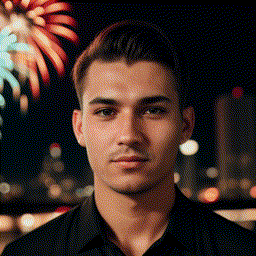

In [86]:
video = load_video("animation_fireworks.gif")
display(Image("animation_fireworks.gif", embed=True))

In [91]:
output = pipe(
    prompt=[
        "closeup of a pretty woman, harley quinn, margot robbie, fireworks in the background, realistic",
        "closeup of a handsome man, robert downey jr, iron man, fireworks in background",
    ],
    negative_prompt=["low quality"] * 2,
    video=[video] * 2,
    height=512,
    width=512,
    guidance_scale=7,
    num_inference_steps=20,
    strength=0.7,
    # generator=[torch.Generator().manual_seed(i) for i in range(2)],
    generator=torch.Generator().manual_seed(1337),
)

2


  0%|          | 0/14 [00:00<?, ?it/s]

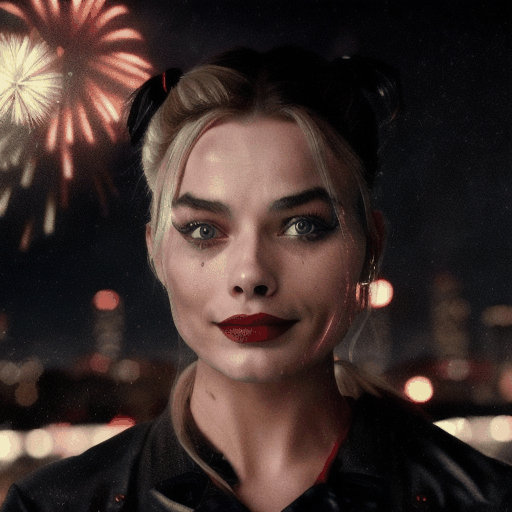

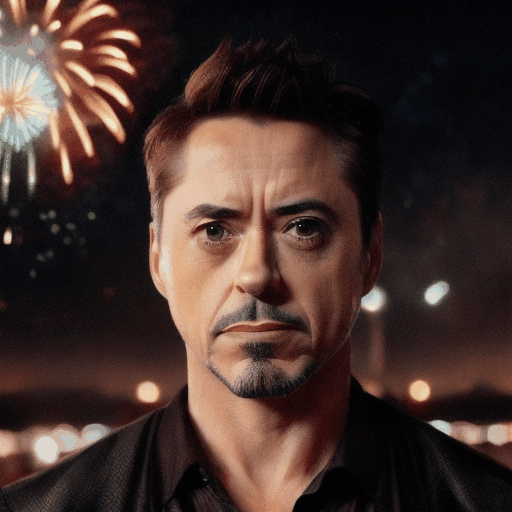

In [92]:
for i in range(len(output.frames)):
    frames = output.frames[i]
    export_to_gif(frames, f"animation_vid2vid_{i}.gif")
    display(Image(f"animation_vid2vid_{i}.gif", embed=True))